# 1er Paso: Importamos las librerías-y módulos- necesarios

In [2]:
import pandas as pd
import time
import requests
from bs4 import BeautifulSoup
import json
import random
import time
from datetime import datetime
import datetime
import os
import numpy as np 
from millify import millify,prettify #tuve que isntalarlo con pip: no hay documentacion de este en anaconda
from tqdm import tqdm

from cred_google_Template  import MY_API_KEY #Recuerda que este es el script en donde tienes tu API de google cloud console, con sus restricciones

# 2do Paso: Almacenamos la API KEY en una varibale

In [3]:
DEVELOPER_KEY = MY_API_KEY

# 3er Paso: Estadísticas del canal
    
        Este paso es bastante interesante. En el vídeo el profe hace el ejercicio con el canal de codigo facilito.
        Sin embargo yo quiero hacer este mismo proceso con el canal del Dr. Carlos Jaramillo

## Copiamos ID del canal 

In [ ]:
#<meta name="twitter:url" content="https://www.youtube.com/channel/UCykTiaMobl2EWW28zmjcznQ">

In [ ]:
#Sin embargo sólo necesitamos la URL del canald e youtube:
url = "https://www.youtube.com/channel/UCykTiaMobl2EWW28zmjcznQ"

In [ ]:
#De la URL sólo necesitamos el fragmento después de .com/channel/
CHANNEL_ID = 'UCykTiaMobl2EWW28zmjcznQ'

#Ahora armamos la URL de la Appi:
'''Investigar más adelante esta documentación. Qué estamos haciendo aquí?
1. Accedemos a la api de youtube
2. Queremos usar la funcionalidad statististics, a partir de la id del canal
3. concatenamos con el CHANNEL_ID, que es la variable dond está la identificación del canal de youtude de DR. Carlos
4. lo concatenamos con DEVELOPER_KEY: La variable en donde está almacenada nuestra API_KEY que creamos dentro de la
google cloud platform para este proeycto en específico''' 

url_channel_stats = 'https://youtube.googleapis.com/youtube/v3/channels?part=statistics&id='+CHANNEL_ID+'&key='+DEVELOPER_KEY

#Hacemos un request.get y este request lo transformamos a un archivo .json
channel_stats = requests.get(url_channel_stats).json()
channel_stats

In [ ]:
#Ojo con el json de arriba: La aprte más importante para nosotros es el campo dentro de items: --
#-- concretamente el campo statistics

In [ ]:
#A partir del Json vamos a crear un diccionari:
channel_statsDict = channel_stats['items'][0]['statistics']
channel_statsDict

In [ ]:
#También necsitamos crear una variable relacionada  a la fecha: Por qué?
#-- porque como vamos a automatizar la extracción(queremos que sea diaria), vamos a --
#--querer tener información respecto a cada día
date = pd.to_datetime('today').strftime('%Y-%m-%d') #Termina en formato string
date

In [ ]:
#Creamos un diccionario relacionado a las fechas

data_channel = {
    'Created_At': date,
    'Total_views': int(float(channel_statsDict['viewCount'])),
    'Suscribers': int(float(channel_statsDict['subscriberCount'])),
    'video_count': int(float(channel_statsDict['videoCount']))
}

data_channel

# 4to Paso: Función de automaritización:

    Observa que simplemente stamos automatizando lo que hicimos en los primeros pasos: Estamos diciendo lo siguiente:
    
    1. Para cualquier canal de youtube, ingresa dos parámetros: 
        a. un script(más específicamente, la VARIABLE en donde almacenas los datos del script) en donde tengas tu API key (privado). Para nuestro ejemplo nuestro script se llama 'cred_templateAdrianAPI.py'
        b. tu channel ID: Lo que puedes extraer por devtools de tu navegador. Pra nuestro caso es 'UCykTiaMobl2EWW28zmjcznQ',
        que es el del canal del Dr. Carlos Jaramillo

In [ ]:
def get_stats(DEVELOPER_KEY, CHANNEL_ID):
    
    url_channel_stats = 'https://youtube.googleapis.com/youtube/v3/channels?part=statistics&id='+CHANNEL_ID+'&key='+DEVELOPER_KEY
    channel_stats = requests.get(url_channel_stats).json() #El json producto del request de la API
    channel_statsDict = channel_stats['items'][0]['statistics'] #Diccionario con las estadísticas, subproducto dle json
    date = pd.to_datetime('today').strftime('%Y-%m-%d') #Elemento con la fecha de hoy
    data_channel = {
    'Created_At': date,
    'Total_views': int(float(channel_statsDict['viewCount'])),
    'Suscribers': int(float(channel_statsDict['subscriberCount'])),
    'video_count': int(float(channel_statsDict['videoCount']))
}
    return data_channel

#Esta funcion 1)extrae la info en un json, 2)crea un diccionario de stats, 3)crea un diccionario con la info final

In [ ]:
#Hagamos la prueba para el canal de athlean X: Debería servir porque nos permitiría usarlo para cualquier canal
'''
etiqueta_athlean = <meta name="twitter:url" content="https://www.youtube.com/channel/UCe0TLA0EsQbE-MjuHXevj2A">
url_athlean = "https://www.youtube.com/channel/UCe0TLA0EsQbE-MjuHXevj2A"
CHANNEL_ID_Atlhean =  'UCe0TLA0EsQbE-MjuHXevj2A'
''' 


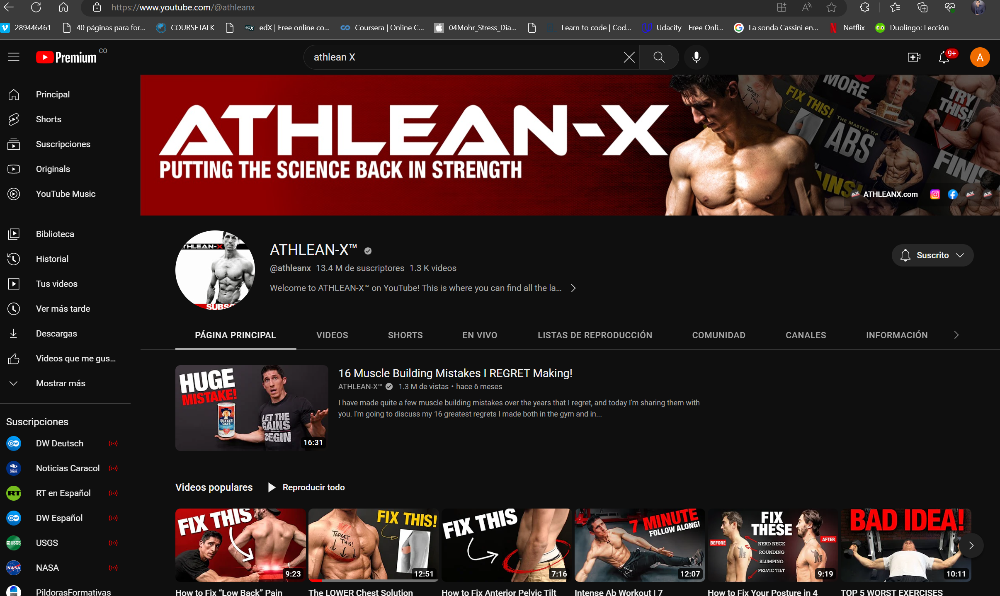

In [ ]:
#Hagamos la prueba para el canal de Fitness Revolucionario: Debería servir porque nos permitiría usarlo para cualquier canal
'''
etiqueta_fitnessRevolucionario = <meta name="twitter:url" content="https://www.youtube.com/channel/UCDe9LvD14Fip9ncPvkcQgxg">
url_fitnessRevolucionario = "https://www.youtube.com/channel/UCDe9LvD14Fip9ncPvkcQgxg"
CHANNEL_ID_Atlhean =  'UCDe9LvD14Fip9ncPvkcQgxg'
''' 

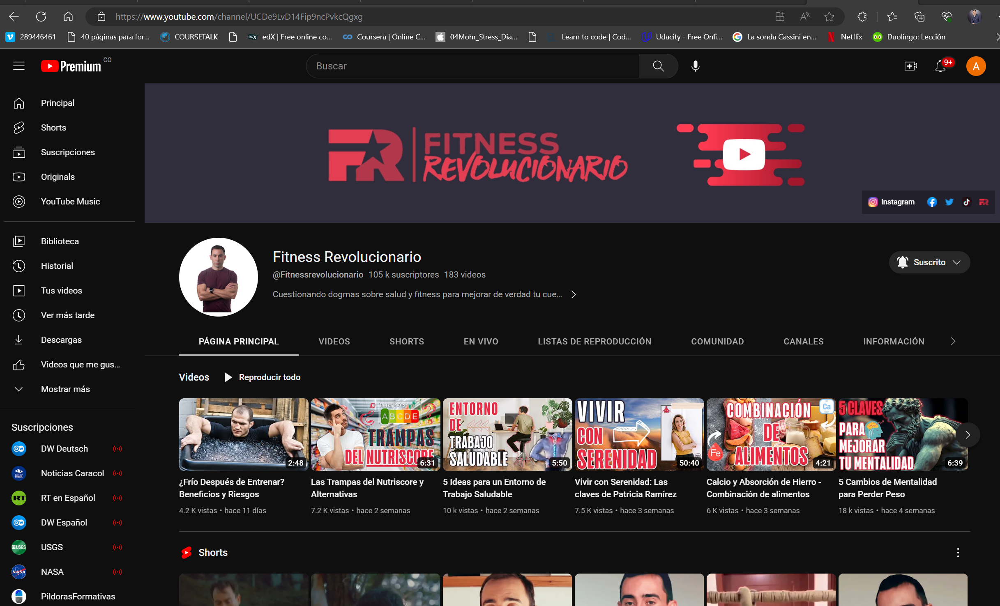

In [ ]:
#Hagamos la prueba para el canal de Farid Naffah: Debería servir porque nos permitiría usarlo para cualquier canal
'''
etiqueta_FaridNaffah = <meta name="twitter:url" content="https://www.youtube.com/channel/UCNByz9XUPvTiiqNK3EXDdxw">
url_fitnessRevolucionario = "https://www.youtube.com/channel/UCNByz9XUPvTiiqNK3EXDdxw"
CHANNEL_ID_Atlhean =  'UCNByz9XUPvTiiqNK3EXDdxw'
''' 

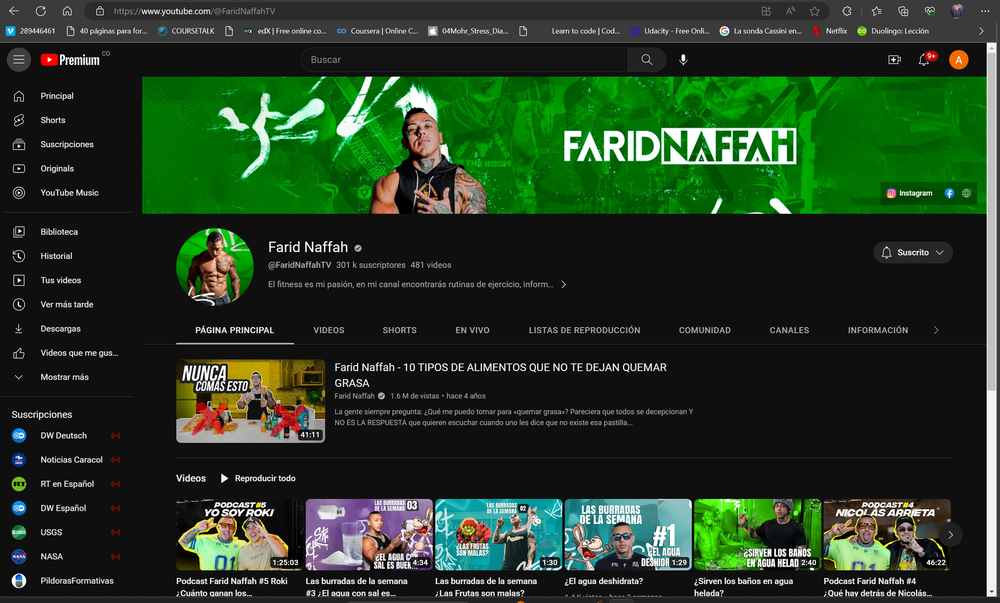

In [ ]:
#Hagamos la prueba para el canal de cesar_the_fit: Debería servir porque nos permitiría usarlo para cualquier canal
'''
etiqueta_CesarTheFit = <meta name="twitter:url" content="https://www.youtube.com/channel/UCAR76PvwLHcHqnbqFIos_Xg">
url_fitnessRevolucionario = "https://www.youtube.com/channel/UCAR76PvwLHcHqnbqFIos_Xg
CHANNEL_ID_Atlhean =  'UCAR76PvwLHcHqnbqFIos_Xg'
''' 

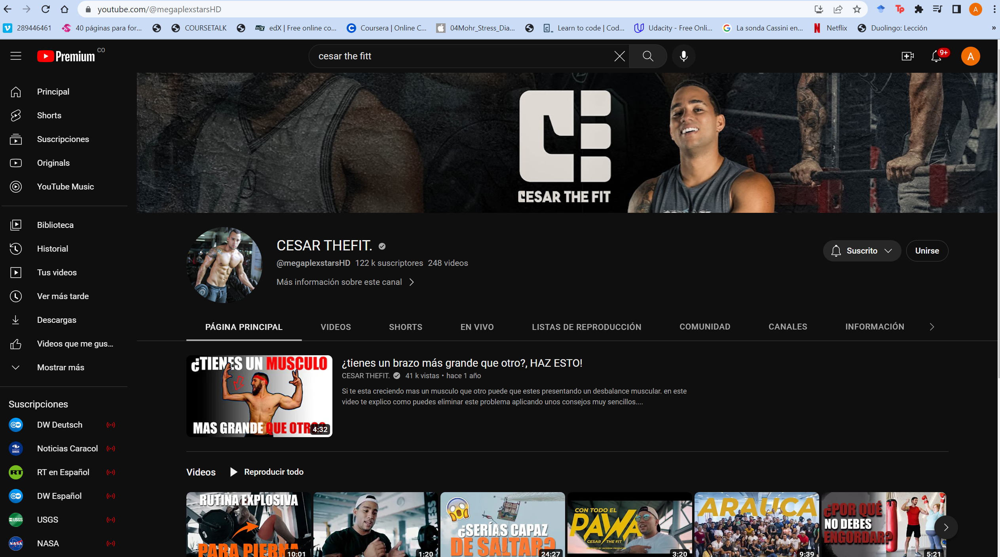

In [ ]:
#Hagamos la prueba usando la función para extraer las estadisticas de estos canales:
#--para esto debemos crear un dataframe a partir de dos listas, usando el método de Pandas pd.Dataframe

channels_name = ['carlos_Jaramillo', 'atlhean_x', 'fitness_revolucionario', 'faird_naffah', 'cesar_thefit']
channels_id = ['UCykTiaMobl2EWW28zmjcznQ','UCe0TLA0EsQbE-MjuHXevj2A', 'UCDe9LvD14Fip9ncPvkcQgxg', 'UCNByz9XUPvTiiqNK3EXDdxw',
             'UCAR76PvwLHcHqnbqFIos_Xg']

channelsDict =  {
    'channel_name': channels_name,
    'channel_id': channels_id
}

channelsDict




In [ ]:
#Y ahora lo transformamos (i.e. el diccionario channelsDict) a un datframe
df_channels = pd.DataFrame.from_dict(channelsDict)
df_channels
#Paso intermedio: Creamos un archivo.csv con este dataframe, para tener un archivo con los nombres de los canales y su id
#--para INTEGRARLO COMO UNA VARIABLE DE ENTORNO EN AWS (Esto se hace hacia el final del proyecto, dont worry)
df_channels.to_csv('channels_to_analize.csv',index = False)


In [ ]:
#Probemos la funci'on en el canal de cesar
get_stats(DEVELOPER_KEY, df_channels['channel_id'][4])



In [ ]:
#Probemos la funci'on en el canal de fitness revolucionario
get_stats(DEVELOPER_KEY, df_channels['channel_id'][2])


# 4to paso.2:  Creación de una función de automarización


In [ ]:
def channel_stats(df, api_key):
    date = []
    views = []
    suscriber = []
    video_count = []
    channel_name = []
    
    tiempo =  [1,2.5,3,2] #Esta lista está relacionada a una buena práctica respecto al request de la API
    
    for i in tqdm(range(len(df)), colour = 'green'):#tqdm es una libreria que permite obtener una 'barra de carga' en in ciclo for
        
        stats_temp = get_stats(DEVELOPER_KEY, df['channel_id'][i])
        #Observa que el insumo es un dataframe con la info de la ID de varios canales
        #Recuerda que esta(i.e. get_stats()) es una funcion que devuelve un diccionario con las estadisticas del canal seleccionado
        
        date.append(stats_temp['Created_At']) #Recuerda que, como stats_temp es un diccionario, --
        views.append(stats_temp['Total_views']) #--podemos acceder a la información de las estadísticas por medio de --
        suscriber.append(stats_temp['Suscribers']) #-- los pares key-value
        video_count.append(stats_temp['video_count'])
        channel_name.append(df_channels['channel_name'][i]) #Recuerda que en stats_name NO se almacena el id del canal, sino en el dataframe
        
        
        time.sleep(random.choice(tiempo)) 
        #Explicacion:
        '''Cada vez que entre a la posicion i del dataframe y se extraigan las estadísticas en stats_temp,
        guardame la date, viwews, suscribers, video_counts y channel_name, y ME ESPERARÁS 1, 2.5, 3 o 2 segundos
        de acuerdo a lo que escoja aleatoriamente y LUEGO vovlerá a hacer la petición CON EL FIN DE NOR ECARGAR LOS 
        SERVIDORES DE TERCEROS.'''
        
    #Ahora creamos un nuevo dataframe con las listas generadas en el paso anterior:
    #--a. Primero creamos un diccionario
    
    data = {
        'Channel_name': channel_name,
        'Suscribers': suscriber,
        'Video_count': video_count,
        'Total_views': views,
        'Created_At': date
    }
    
    #Hasta aqui se ha creado un diccionario con las estadisticas de todos los canales. El paso final
    #--deberia ser el paso de toda esta informacion a una estructura tabular: i.e. un dataframe
    
    #b. Luego creamos un dataframe a partir de este diccionario
    df_channels_final = pd.DataFrame(data)
    
    return df_channels_final
    
    

In [ ]:
#Finalmente tenemos una función que NOS DEVUELVE UN DATAFRAME CON LAS ESTADISTICAS DE LOS CANALES DE NUESTRO INTERÉS, --
#-- FIJATE QUE SOLO NECESITAMOS DE DOS INSUMOS: UN API_KEY Y UN DATAFRAME ORIGINAL QUE TENGA LOS ID DE LOS CANALES
#Probemoslo:

'''Recuerda:
df_channels  es el dataframe en donde está el mombre de los canales, y la id de los canales: Fue el ejercicio
de práctica que hiciste al principio, pero puedes construir cualqueir otro desde que tengas los id de los canales
de intertés

DEVELOPER_KEY es una variable en donde ingresaste la API_KEY de youtube.''' 
channel_stats(df_channels, DEVELOPER_KEY)